# **Identifying Churns for Telecom Industry**

---



# Problem Statement

In the highly competitive telecom industry, customers can easily switch between service providers, leading to a significant annual churn rate of 15-25%. Given that acquiring a new customer costs 5-10 times more than retaining an existing one, telecom companies are focused on customer retention, especially of highly profitable customers.

To reduce churn, telecom companies must predict which customers are at high risk of leaving. This project involves analyzing customer-level data from a leading telecom firm to build predictive models that identify customers at risk of churn and uncover key indicators contributing to churn.

Understanding Churn in the Telecom Industry:

There are two main payment models in telecom:

* Postpaid: Customers pay after using services, and churn is
 straightforward to identify when they notify the operator to terminate the service.
* Prepaid: Customers pay in advance and can stop using services without
 notice, making it difficult to determine if they have churned or are temporarily inactive. Churn prediction is particularly challenging and crucial for prepaid customers.


Given the prevalence of prepaid models in India and Southeast Asia, this project focuses on these markets, where accurately defining and predicting churn is critical for business success. The goal is to use customer data to build a model that predicts churn and highlights the primary factors influencing customer retention.

## Data Reading and Understanding

In [70]:
## importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [71]:
## import the Data from csv file
churn_df = pd.read_csv('telecom_churn_data.csv')
churn_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [72]:
# Checking the Shape of Dataset
churn_df.shape

(99999, 226)

In [73]:
#Information about the Features
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [74]:
#Describing the Features
churn_df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


## Data Cleaning and Data Preparation

In [75]:
## Dataset Columns
df_col = churn_df.columns
df_col

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [76]:
# Calculate the percentage of missing values in each column
round(100*(churn_df.isnull().sum()/len(churn_df.index)),2).sort_values(ascending=False)

,0
arpu_3g_6,74.85
night_pck_user_6,74.85
total_rech_data_6,74.85
arpu_2g_6,74.85
max_rech_data_6,74.85
...,...
max_rech_amt_7,0.00
max_rech_amt_6,0.00
total_rech_amt_9,0.00
total_rech_amt_8,0.00


In [77]:
### Remove the columns having missing values more than 40%
del_col = []
for col in df_col:
    if (100*(churn_df[col].isnull().sum()/len(churn_df.index))) > 40:
        del_col += [col]
        churn_df.drop(col,axis=1,inplace=True)

In [78]:
churn_df.shape

(99999, 186)

In [79]:
# Checking null values in columns after dropping columns
round(100*(churn_df.isnull().sum()/len(churn_df.index)),2).sort_values(ascending=False)

,0
loc_og_t2m_mou_9,7.75
loc_ic_t2m_mou_9,7.75
offnet_mou_9,7.75
std_ic_t2f_mou_9,7.75
roam_ic_mou_9,7.75
...,...
max_rech_amt_7,0.00
max_rech_amt_8,0.00
max_rech_amt_9,0.00
last_day_rch_amt_6,0.00


### Now Delete columns which had skewed to one distinct value

In [80]:
## Dropping the columns which had skewed to one class
churn_df = churn_df.drop(['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_6',
                          'last_date_of_month_7','last_date_of_month_8','last_date_of_month_9','std_og_t2c_mou_6',
                          'std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_6',
                          'std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9'],axis=1)

In [81]:
churn_df.shape

(99999, 170)

In [82]:
### Drop the mobile number because as its not important for analysis
churn_df.drop('mobile_number',inplace=True,axis=1)

In [83]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 169 entries, arpu_6 to sep_vbc_3g
dtypes: float64(132), int64(33), object(4)
memory usage: 128.9+ MB


In [84]:
df_col = churn_df.columns

In [85]:
## changing the object datatype to Datetime Format
churn_df['date_of_last_rech_6'] = pd.to_datetime(churn_df['date_of_last_rech_6'], format='%m/%d/%Y',errors='coerce')
churn_df['date_of_last_rech_7'] = pd.to_datetime(churn_df['date_of_last_rech_7'], format='%m/%d/%Y',errors='coerce')
churn_df['date_of_last_rech_8'] = pd.to_datetime(churn_df['date_of_last_rech_8'], format='%m/%d/%Y',errors='coerce')
churn_df['date_of_last_rech_9'] = pd.to_datetime(churn_df['date_of_last_rech_9'], format='%m/%d/%Y',errors='coerce')

In [86]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 169 entries, arpu_6 to sep_vbc_3g
dtypes: datetime64[ns](4), float64(132), int64(33)
memory usage: 128.9 MB


## Feature Engineering

### Deriving new features from the Existing Fratures

In [87]:
## Retrieving the Days, from before month recharge
churn_df['days_rech_after_6'] = (churn_df['date_of_last_rech_7'] - churn_df['date_of_last_rech_6']).dt.days

In [88]:
## Retrieving the Days, from before month recharge
churn_df['days_rech_after_7'] = (churn_df['date_of_last_rech_8'] - churn_df['date_of_last_rech_7']).dt.days

In [89]:
## Retrieving the Days, from before month recharge
churn_df['days_rech_after_8'] = (churn_df['date_of_last_rech_9'] - churn_df['date_of_last_rech_8']).dt.days

In [90]:
churn_df['days_rech_after_6'].head()

,days_rech_after_6
0,25.0
1,32.0
2,37.0
3,33.0
4,32.0


In [91]:
## dropping the features after deriving the New Features from exiting features
churn_df.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9'],inplace=True,axis=1)

In [92]:
churn_df.shape

(99999, 168)

## Handling Missing Values

In [93]:
df_col = churn_df.columns

In [94]:
# Calculate the percentage of missing values in each column
round(100*(churn_df.isnull().sum()/len(churn_df.index)),2).sort_values(ascending=False)

,0
og_others_9,7.75
std_og_t2m_mou_9,7.75
std_ic_t2f_mou_9,7.75
std_ic_t2m_mou_9,7.75
loc_og_t2t_mou_9,7.75
...,...
last_day_rch_amt_7,0.00
last_day_rch_amt_8,0.00
last_day_rch_amt_9,0.00
vol_2g_mb_6,0.00


In [95]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 168 entries, arpu_6 to days_rech_after_8
dtypes: float64(135), int64(33)
memory usage: 128.2 MB


### Impute all Null values with their corresponding mean

In [96]:
## Finding the mean for all the features
mean_values = churn_df.mean()
mean_values

,0
arpu_6,282.987358
arpu_7,278.536648
arpu_8,279.154731
arpu_9,261.645069
onnet_mou_6,132.395875
...,...
jun_vbc_3g,60.021204
sep_vbc_3g,3.299373
days_rech_after_6,31.308821
days_rech_after_7,30.855691


In [97]:
## imputing the null values with mean
churn_df = churn_df.fillna(mean_values)

In [98]:
## checking the shape
churn_df.shape

(99999, 168)

In [99]:
# Calculate the percentage of missing values in each column
round(100*(churn_df.isnull().sum()/len(churn_df.index)),2).sort_values(ascending=False)

,0
arpu_6,0.0
isd_ic_mou_9,0.0
total_ic_mou_9,0.0
spl_ic_mou_6,0.0
spl_ic_mou_7,0.0
...,...
isd_og_mou_7,0.0
isd_og_mou_8,0.0
isd_og_mou_9,0.0
spl_og_mou_6,0.0


### Finally our Data set is cleaned with zero null values and now its suitable for analysis

###  Filter High-value customers

##### As need to predict churn only for high-value customers. Define high-value customers as those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

In [100]:
##  average recharge amount in the first two months (the good phase).
churn_df['avg_rech_in_two_mon'] = (churn_df['total_rech_amt_6']+ churn_df['total_rech_amt_7']) / 2

In [101]:
## Checking the avgarge values
churn_df[['total_rech_amt_6','total_rech_amt_7','avg_rech_in_two_mon']].head()

,total_rech_amt_6,total_rech_amt_7,avg_rech_in_two_mon
0,362,252,307.0
1,74,384,229.0
2,168,315,241.5
3,230,310,270.0
4,196,350,273.0


In [102]:
## 70th percentile of the average recharge amount in the first two months
percentile_70 = churn_df['avg_rech_in_two_mon'].quantile(0.70)
percentile_70

368.5

In [103]:
## Filter high-value customers
churn_df = churn_df[churn_df['avg_rech_in_two_mon']>=369]

In [104]:
## Checking the shape of high-value customers
churn_df.shape

(29979, 169)

### Tag churners and remove attributes of the churn phase

#### Now tag the churned customers (churn=1, else 0) based on the fourth month as – those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes you need to use to tag churners are:

  * total_ic_mou_9

  * total_og_mou_9

  * vol_2g_mb_9

  * vol_3g_mb_9

In [105]:
## checking the columns required for tagging
churn_df[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].head()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
7,0.00,0.00,0.0,0.0
8,34.91,142.18,0.0,0.0
13,631.86,446.09,0.0,0.0
16,334.56,255.74,0.0,0.0
17,87.13,631.08,0.0,0.0


In [106]:
### Tag churners
churn_df['churn'] = (
    (churn_df['total_ic_mou_9'] == 0) &
    (churn_df['total_og_mou_9'] == 0) &
    (churn_df['vol_2g_mb_9'] == 0) &
    (churn_df['vol_3g_mb_9'] == 0)
).astype(int)

In [107]:
## Checking the value counts of both classes
churn_df['churn'].value_counts()

,count
churn,
0,27390
1,2589


#### We had an Class Imbalance Data which we need to Handle using some Techniques

### Remove attributes of the churn phase

In [108]:
## Remove attributes of the churn phase
columns_to_remove = [col for col in churn_df.columns if '_9' in col]
columns_to_remove

['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'last_day_rch_amt_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9']

In [109]:
## Dropping the columns
churn_df = churn_df.drop(columns_to_remove,axis=1)

In [110]:
### Checking the shape of Final Dataset
churn_df.shape

(29979, 130)

In [111]:
## checking the Df
churn_df.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,days_rech_after_6,days_rech_after_7,days_rech_after_8,avg_rech_in_two_mon,churn
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,...,802,57.74,19.38,18.74,0.0,28.0,32.0,35.0,1185.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,...,315,21.03,910.65,122.16,0.0,36.0,30.0,31.0,519.0,0
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,...,2607,0.00,0.00,0.00,0.0,32.0,39.0,27.0,380.0,0
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,...,511,0.00,2.45,21.89,0.0,31.0,14.0,27.0,459.0,0
17,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,0.00,...,667,0.00,0.00,0.00,0.0,30.0,26.0,35.0,408.0,0


## Data Analysis-Using Visualisation

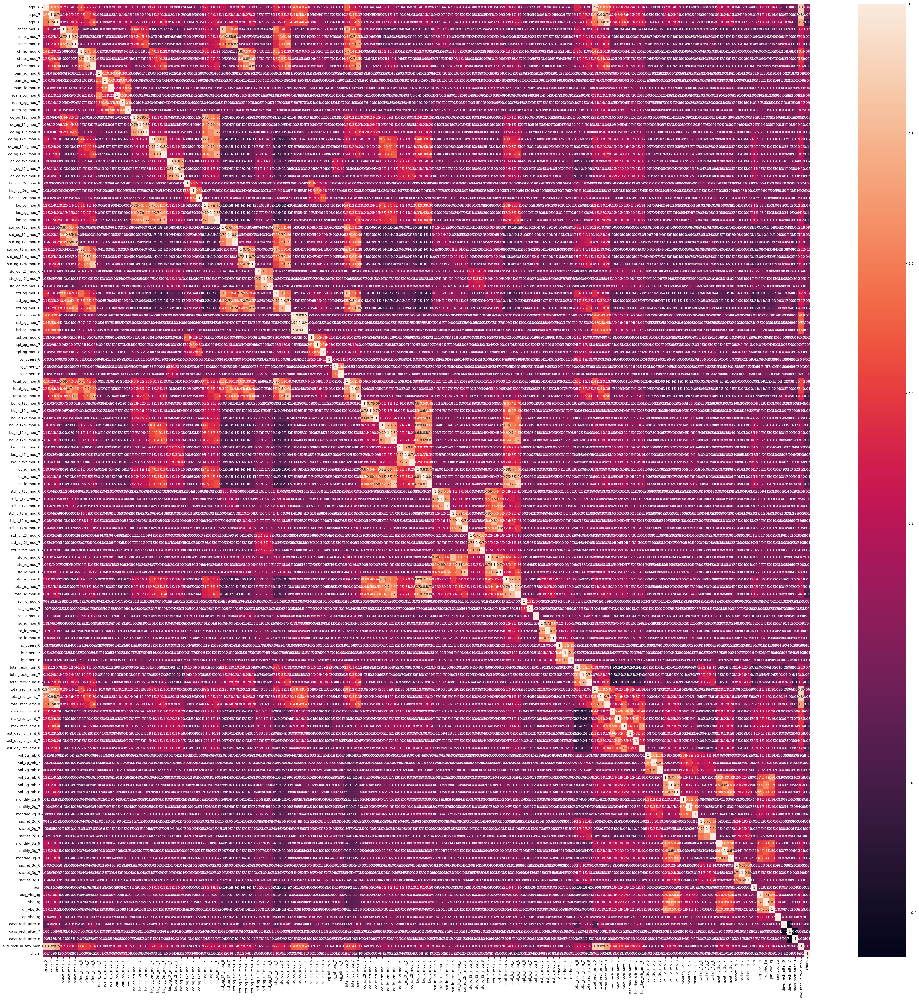

In [ ]:
plt.figure(figsize=(50,50))
sns.heatmap(churn_df.corr(), annot=True)
plt.show()

### Checking some inportant feature correlation with Target Variable

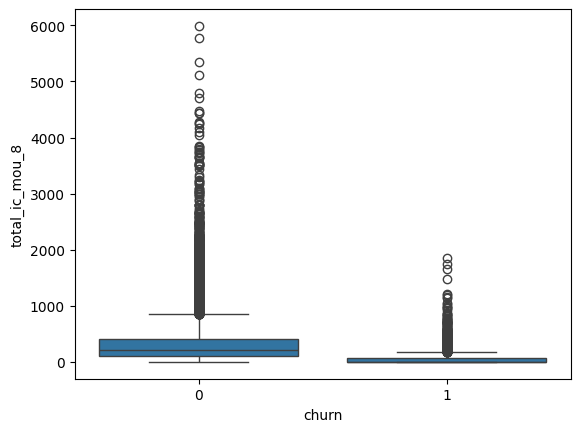

In [ ]:
sns.boxplot(x='churn',y='total_ic_mou_8',data=churn_df)
plt.show()

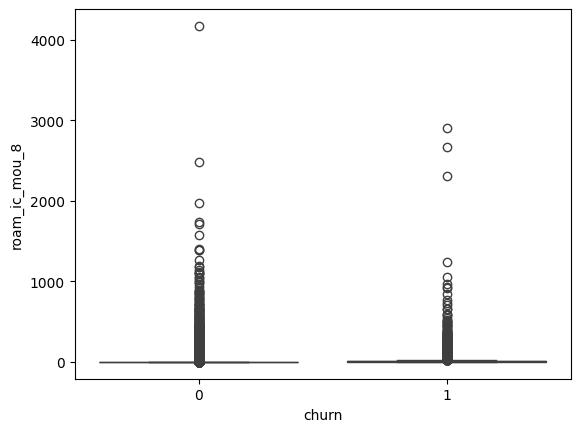

In [ ]:
sns.boxplot(x='churn',y='roam_ic_mou_8',data=churn_df)
plt.show()

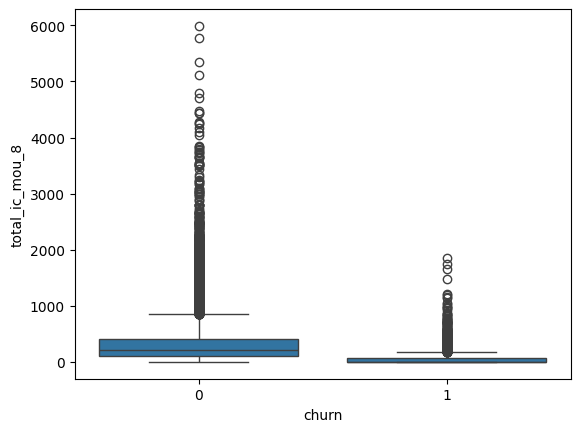

In [ ]:
sns.boxplot(x='churn',y='total_ic_mou_8',data=churn_df)
plt.show()

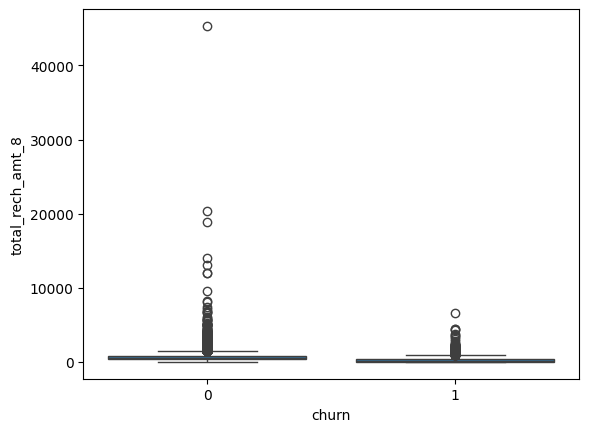

In [ ]:
sns.boxplot(x='churn',y='total_rech_amt_8',data=churn_df)
plt.show()

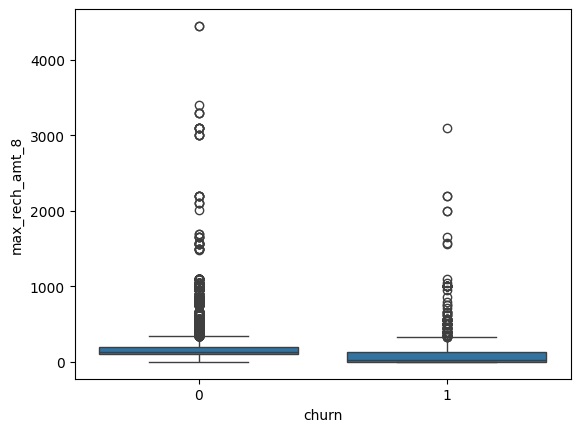

In [ ]:
sns.boxplot(x='churn',y='max_rech_amt_8',data=churn_df)
plt.show()

### Lets check some important relations between variables using pair plots

In [61]:
imp_feat = ['loc_og_mou_8','offnet_mou_8',
            'loc_ic_t2m_mou_8','max_rech_amt_8','churn',]

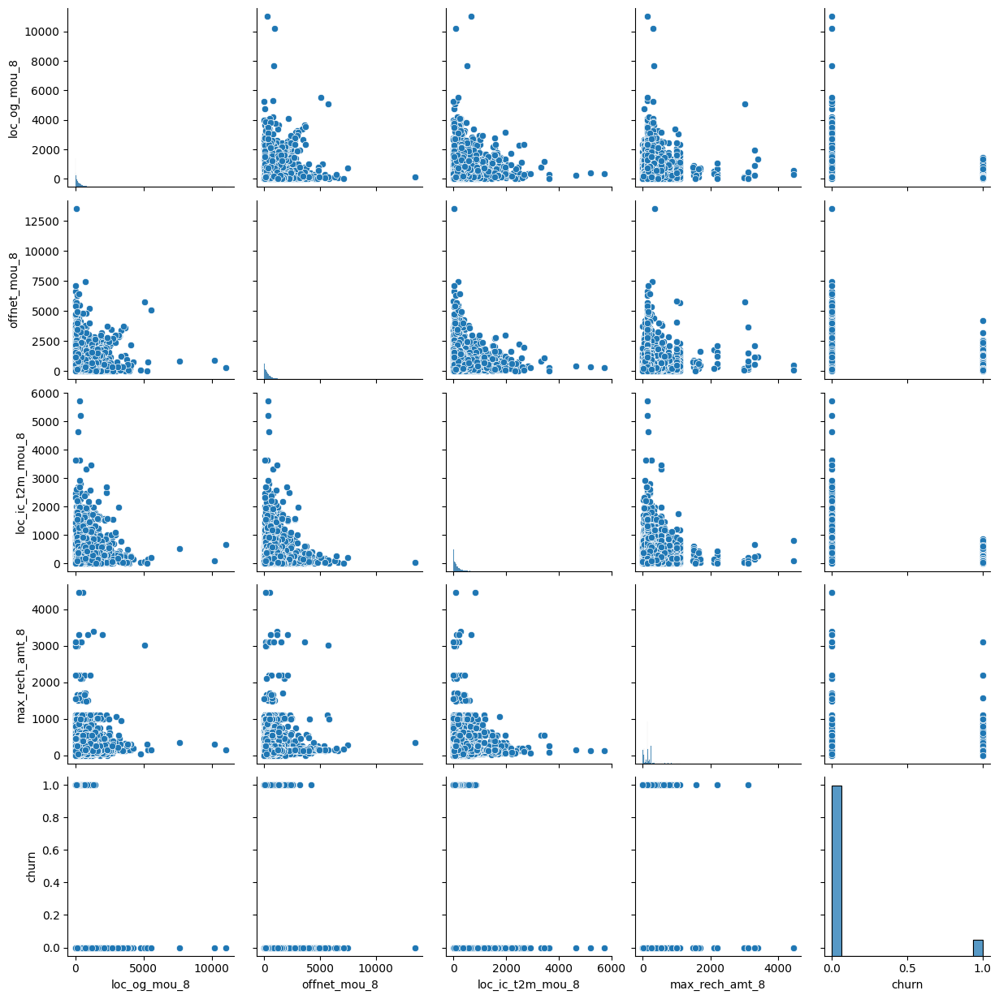

In [62]:
sns.pairplot(churn_df[imp_feat])
plt.show()

## Feature Scaling

#### Spliting the Data into Dependent and Independent Variables


In [114]:
## Spliting the Data into Dependent and Independent Variables
X = churn_df.drop('churn',axis=1)
y = churn_df['churn']

In [115]:
X.shape,y.shape

((29979, 129), (29979,))

### Spliting the Data into Train and Test Dataset

In [116]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

In [117]:
X_train.shape,X_test.shape

((20985, 129), (8994, 129))

### Scaling and fitting the Features

In [118]:
## Scaling and Fitting the Features into one scale for PCA
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

### Reduce the number of variables using PCA.

In [119]:
## Reduce the number of variables using PCA.
from sklearn.decomposition import PCA
pca = PCA()
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [120]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([9.58793971e-02, 8.50729533e-02, 5.82940987e-02, 4.61053298e-02,
       3.82154573e-02, 3.52414475e-02, 3.09827855e-02, 2.70083642e-02,
       2.55435273e-02, 2.44586442e-02, 2.32665828e-02, 2.22485096e-02,
       2.11296764e-02, 2.08962434e-02, 2.01797203e-02, 1.87174378e-02,
       1.60747337e-02, 1.58328182e-02, 1.39902899e-02, 1.38825682e-02,
       1.32348628e-02, 1.30962674e-02, 1.19744844e-02, 1.17166903e-02,
       1.02051559e-02, 9.94680826e-03, 9.62711133e-03, 9.40398777e-03,
       9.06529351e-03, 8.90079100e-03, 8.12437629e-03, 7.75128189e-03,
       7.56362242e-03, 7.45722749e-03, 7.24416440e-03, 7.07434667e-03,
       7.01562539e-03, 6.56160831e-03, 6.35655994e-03, 6.22819786e-03,
       6.15730660e-03, 6.07398775e-03, 6.05072321e-03, 5.70830906e-03,
       5.56565864e-03, 5.27336097e-03, 5.03965774e-03, 4.87195252e-03,
       4.73259066e-03, 4.68371879e-03, 4.33871315e-03, 4.05625627e-03,
       3.96802603e-03, 3.92153467e-03, 3.88490699e-03, 3.81358706e-03,
      

## Building the Random Forest Classification Model

Class Weight Adjustment:
Modify the class weights in algorithms (e.g., Logistic Regression, Random Forest, SVM) to penalize the model more for misclassifying the minority class. This method tells the algorithm to pay more attention to the minority class during training.We Used Algorithmic Adjustments using class-weight(balanced)

In [121]:
## Balancing the class Imbalanace
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(class_weight='balanced')

In [122]:
### Building the model
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=10, max_depth=10,random_state=100,
                            class_weight='balanced')
model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', max_depth=10, n_estimators=10,
                       random_state=100)

In [123]:
## Predicting the Values for test Data
y_test_pred = model.predict(X_test)

In [124]:
## Predicted Results
y_test_pred

array([0, 0, 0, ..., 0, 0, 0])

## Evaluation of Model

In [125]:
## Classification Report
from sklearn import metrics
from sklearn.metrics import classification_report
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.96      0.95      0.95      8179
           1       0.52      0.59      0.55       815

    accuracy                           0.91      8994
   macro avg       0.74      0.77      0.75      8994
weighted avg       0.92      0.91      0.92      8994



In [126]:
## Checking the accuracy of the model
metrics.accuracy_score(y_test,y_test_pred)

0.9140538136535468

We get an accuracy of 91% it's very Good Accuracy the Model i.e, the Model we build is efficient

In [127]:
## Checking the confusion matrix
metrics.confusion_matrix(y_test,y_test_pred)

array([[7739,  440],
       [ 333,  482]])

### ROC Curve

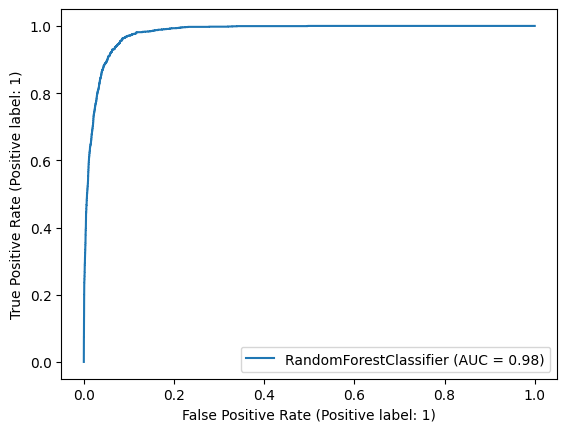

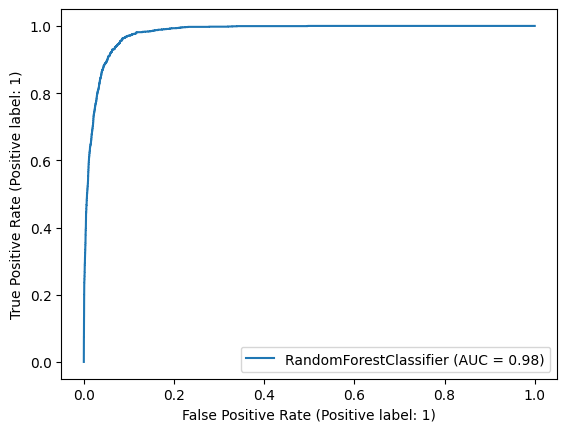

In [128]:
## PLotting the ROC Curve
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_estimator(model, X_train, y_train).plot()

#### We had an Area under curve value as 0.98 its represent the model which built is good

## Hyper-parameter tuning for the Random Forest

#### Hyper-parameter tuning for the Random Forest  to find the Best parameters for model better performance and efficient model, which generalize the model.

In [ ]:
## Building Random Forest classifier
rf = RandomForestClassifier(random_state=42, n_jobs=-1,class_weight='balanced')

In [ ]:
## Hyper-parameter for the Better Model
params = {
    'max_depth': [10,20,50],
    'min_samples_leaf': [20,50,100],
    'n_estimators': [20,50]
}

### Grid Search uses the Bagging technique for random samples of Obeservations uses folds

In [ ]:
## Importing the GridSearchcv
from sklearn.model_selection import GridSearchCV

In [ ]:
### Initiating the gridsearch
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [ ]:
## Fitting the Model on different Hyper-parameters
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 18 candidates, totalling 72 fits
CPU times: user 22.5 s, sys: 539 ms, total: 23 s
Wall time: 7min 19s


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 50],
                         'min_samples_leaf': [20, 50, 100],
                         'n_estimators': [20, 50]},
             scoring='accuracy', verbose=1)

In [ ]:
## Checking the Score of GridSearchCv
grid_search.best_score_

0.9251850684460616

In [ ]:
## Best Params
grid_search.best_params_

{'max_depth': 50, 'min_samples_leaf': 20, 'n_estimators': 50}

In [ ]:
## Identifying the Best Estimater
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(class_weight='balanced', max_depth=50,
                       min_samples_leaf=20, n_estimators=50, n_jobs=-1,
                       random_state=42)

#### Fitting the Best Model using Hyperparameters

In [ ]:
## Fitting the Best Model using Hyperparameters
## Building Random Forest classifier
rf_best = RandomForestClassifier(random_state=42, n_jobs=-1,class_weight='balanced',
                              max_depth= 50, min_samples_leaf= 20, n_estimators= 50)
rf_best.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=50,
                       min_samples_leaf=20, n_estimators=50, n_jobs=-1,
                       random_state=42)

In [ ]:
## Predicting the test values
y_test_pred = rf_best.predict(X_test)

In [ ]:
## Classification Report
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      8179
           1       0.58      0.61      0.60       815

    accuracy                           0.93      8994
   macro avg       0.77      0.79      0.78      8994
weighted avg       0.93      0.93      0.93      8994



In [ ]:
## accuracy Score
metrics.accuracy_score(y_test,y_test_pred)

0.9252835223482322

In [ ]:
## Confusion matrix
metrics.confusion_matrix(y_test,y_test_pred)

array([[7821,  358],
       [ 314,  501]])

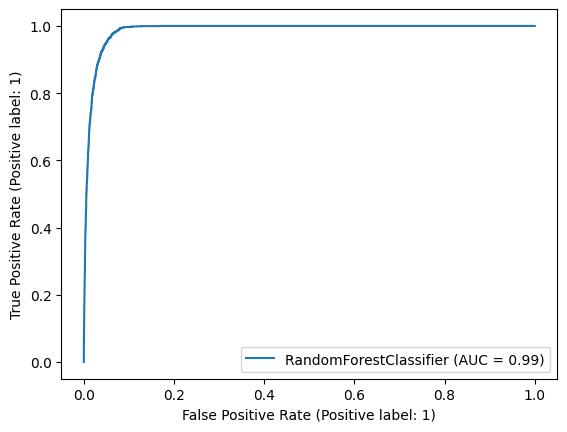

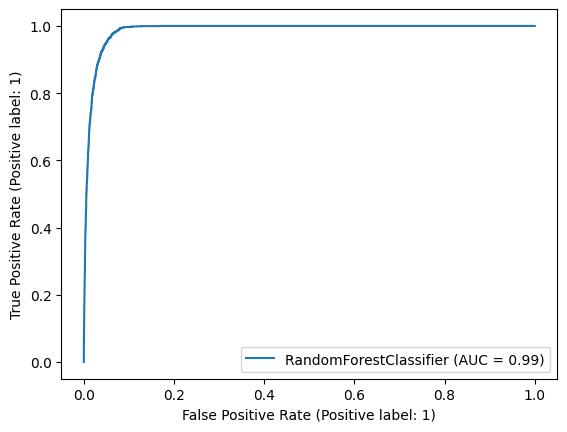

In [ ]:
## ROC Curev
RocCurveDisplay.from_estimator(rf_best, X_train, y_train).plot()

#### We are finding Best Area Under Curve which is 99%

#### Finally Random Forest with using Hyper Parameters we find an effective model.
#### Model With an accuracy of 92% and with AUC as 99% which is Good and Effective model for predicting High values churn customers.

## Building model for Identifying Important Predictors

In [ ]:
churn_df.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,days_rech_after_6,days_rech_after_7,days_rech_after_8,avg_rech_in_two_mon,churn
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,...,802,57.74,19.38,18.74,0.0,28.0,32.0,35.0,1185.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,...,315,21.03,910.65,122.16,0.0,36.0,30.0,31.0,519.0,0
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,...,2607,0.00,0.00,0.00,0.0,32.0,39.0,27.0,380.0,0
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,...,511,0.00,2.45,21.89,0.0,31.0,14.0,27.0,459.0,0
17,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,0.00,...,667,0.00,0.00,0.00,0.0,30.0,26.0,35.0,408.0,0


In [ ]:
## Spliting the Data into Dependent and Independent Variables
X = churn_df.drop('churn',axis=1)
y = churn_df['churn']

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

In [ ]:
X_train.shape,X_test.shape

((20985, 129), (8994, 129))

In [ ]:
help(RandomForestClassifier)

Help on class RandomForestClassifier in module sklearn.ensemble._forest:

class RandomForestClassifier(ForestClassifier)
 |  RandomForestClassifier(n_estimators=100, *, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)
 |  
 |  A random forest classifier.
 |  
 |  A random forest is a meta estimator that fits a number of decision tree
 |  classifiers on various sub-samples of the dataset and uses averaging to
 |  improve the predictive accuracy and control over-fitting.
 |  The sub-sample size is controlled with the `max_samples` parameter if
 |  `bootstrap=True` (default), otherwise the whole dataset is used to build
 |  each tree.
 |  
 |  For a comparison between tree-based ensemble models see the example
 |  :ref:`sp

In [ ]:
## Building the model for Identifying Best Features
model_feat = RandomForestClassifier(n_estimators=50, max_depth=50,min_samples_leaf=20,random_state=100,
                            class_weight='balanced',max_features=5,oob_score=True)
model_feat.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=50, max_features=5,
                       min_samples_leaf=20, n_estimators=50, oob_score=True,
                       random_state=100)

In [ ]:
## Checking the oob score
model_feat.oob_score_

0.9230879199428162

In [ ]:
## Feature Importance
model_feat.feature_importances_

array([4.59632785e-03, 5.68125481e-03, 3.79557794e-02, 3.68697317e-03,
       3.67476515e-03, 8.99939759e-03, 3.20654970e-03, 4.98658290e-03,
       2.62056283e-02, 2.27802010e-03, 6.71832273e-03, 6.00267704e-02,
       1.16736115e-03, 8.62956299e-03, 4.05139812e-02, 3.36362995e-03,
       3.06349937e-03, 2.21470537e-02, 3.59908386e-03, 7.72495788e-03,
       2.15832753e-02, 1.58015366e-03, 2.15111409e-03, 8.32474969e-03,
       8.62956722e-04, 1.29243648e-03, 1.75067632e-03, 4.61929506e-03,
       9.04615549e-03, 5.23729472e-02, 4.06334092e-03, 6.45449923e-03,
       8.87262762e-03, 5.89832390e-03, 3.97654250e-03, 7.78298469e-03,
       5.62164590e-04, 6.93753843e-04, 6.84723961e-03, 7.31764107e-03,
       5.05214353e-03, 1.30464052e-02, 6.52611587e-04, 1.11636785e-03,
       1.46106569e-02, 2.17699660e-03, 2.87872757e-03, 4.79708389e-03,
       1.15883484e-03, 5.34118028e-05, 1.53759337e-03, 4.44851328e-03,
       8.59100664e-03, 1.58475680e-02, 2.83515791e-03, 5.34836661e-03,
      

In [ ]:
## Displaying Feature Importance
imp_features = pd.DataFrame({
    'feature': X.columns,
    'importance': model_feat.feature_importances_
})
imp_features.sort_values(by='importance', ascending=False).head(10)

,feature,importance
80,total_ic_mou_8,0.067930
11,roam_ic_mou_8,0.060027
29,loc_og_mou_8,0.052373
95,total_rech_amt_8,0.043968
14,roam_og_mou_8,0.040514
101,last_day_rch_amt_8,0.038499
2,arpu_8,0.037956
98,max_rech_amt_8,0.031898
59,loc_ic_t2m_mou_8,0.029091
8,offnet_mou_8,0.026206


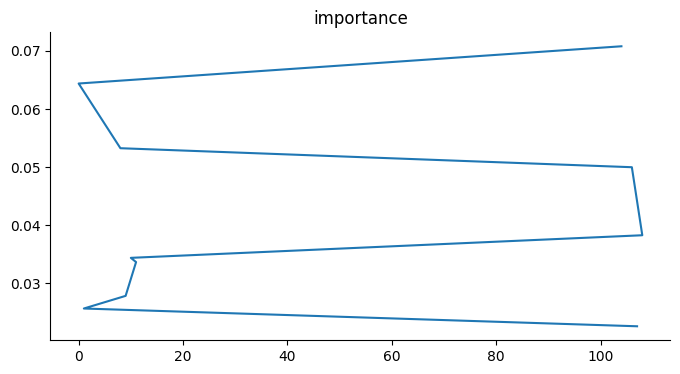

In [ ]:
## Plotting the Feature Importance
from matplotlib import pyplot as plt
_df_3['importance'].plot(kind='line', figsize=(8, 4), title='importance')
plt.gca().spines[['top', 'right']].set_visible(False)

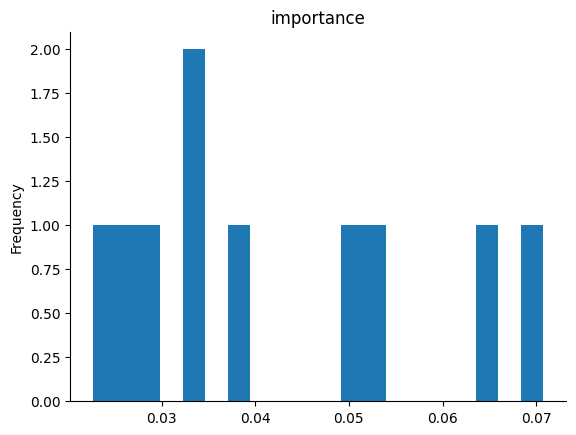

In [ ]:
## Plotting the Feature Importance
from matplotlib import pyplot as plt
_df_2['importance'].plot(kind='hist', bins=20, title='importance')
plt.gca().spines[['top', 'right',]].set_visible(False)

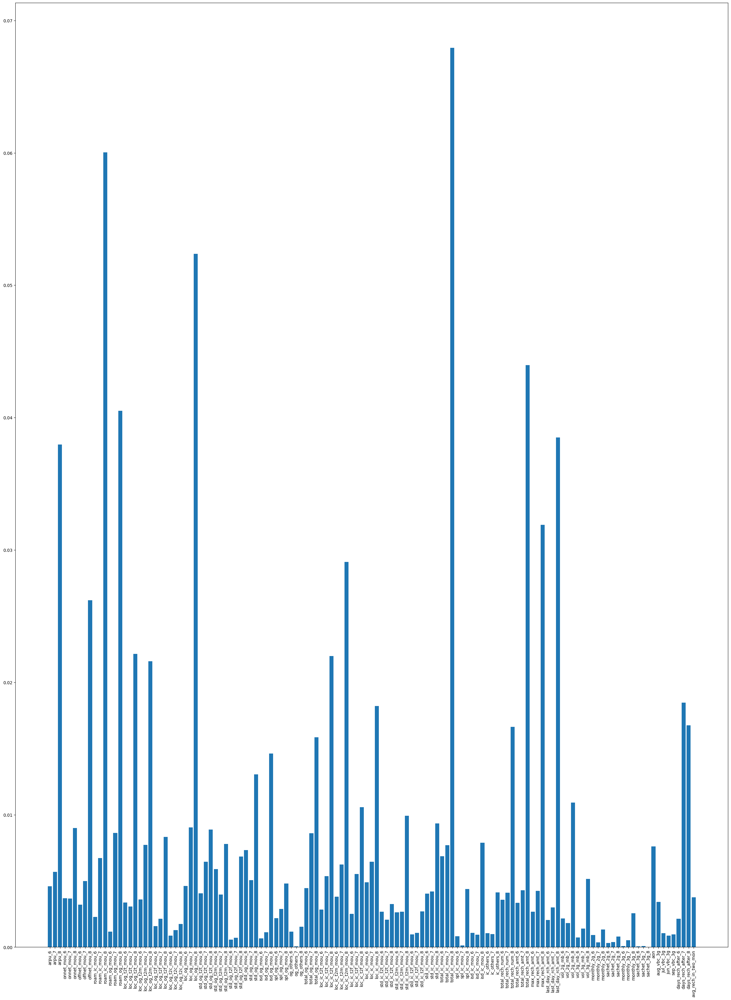

In [ ]:
## Plotting the Feature Importance
plt.figure(figsize=(30,40))
plt.bar(X.columns, model_feat.feature_importances_)
plt.xticks(rotation=90)
plt.show()

In [ ]:
df_col = churn_df.columns

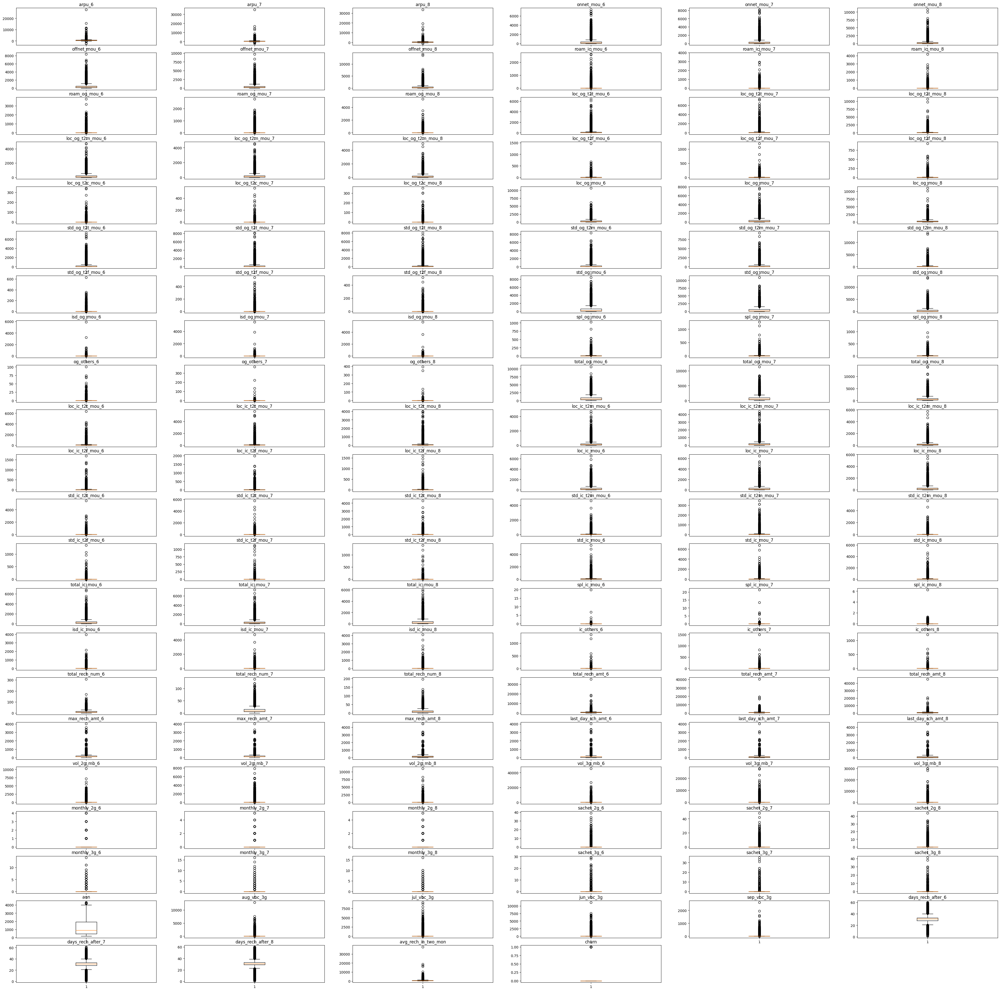

In [ ]:
## Understanding Numerical Variable
plt.figure(figsize=(50,50))
k = 0
for col in df_col:
    k = k + 1
    plt.subplot(22,6,k)
    plt.boxplot(churn_df[col])
    plt.title(col)

In [65]:
churn_df.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g',
       'days_rech_after_6', 'days_rech_after_7', 'days_rech_after_8',
       'avg_rech_in_two_mon', 'churn'],
      dtype='object', length=130)

## Actionable Recommendations

1) Keep an Eye on Revenue Trends
* What to Watch: The features arpu_6, arpu_7, arpu_8 show the average revenue per user over three months.
* Why It Matters: If a customer’s spending (ARPU) is going down, they might be losing interest or considering switching to another provider.
* What to Do:
Reach out to these customers with special offers, discounts, or loyalty rewards to encourage them to stay.
Create personalized campaigns that highlight benefits and services they might find valuable, like exclusive data plans or bundled services.

2) Offer Better Call Plans:

* What to Watch: Features like onnet_mou_6, onnet_mou_7, onnet_mou_8 (minutes spent on calls within the network) and offnet_mou_6, offnet_mou_7, offnet_mou_8 (minutes spent on calls outside the network).
* Why It Matters: Customers who make a lot of calls within or outside the network may leave if they find cheaper call plans elsewhere.
* What to Do:
Create and promote call plans tailored to heavy users, offering them better rates or additional benefits.
Bundle different call types together to encourage more usage and loyalty.

3) Make Roaming More Affordable:

* What to Watch: roam_ic_mou_6, roam_ic_mou_7, roam_ic_mou_8 (minutes used for incoming calls while roaming).
* Why It Matters: Customers who travel a lot could be looking for operators with better roaming deals.
* What to Do:
Offer special roaming packages or discounts to frequent travelers.
Improve the roaming experience by ensuring strong network coverage and good call quality.

4) Encourage Data Usage with Attractive Plans:

* What to Watch: aug_vbc_3g, jul_vbc_3g, jun_vbc_3g, sep_vbc_3g (charges for data usage).
* Why It Matters: High data charges can drive customers away if they find better data deals with competitors.
* What to Do:
Promote affordable or unlimited data plans to customers who use a lot of data.
Offer extra data or exclusive plans to loyal customers who regularly exceed their data limits.

5) Boost Recharge Frequency and Customer Engagement:

* What to Watch: days_rech_after_6, days_rech_after_7, days_rech_after_8 (days since last recharge) and avg_rech_in_two_mon (average recharge over two months).
* Why It Matters: Customers who aren’t recharging frequently or have reduced their recharge amounts may be thinking about leaving.
* What to Do:
Send reminders and offer incentives like cashback or discounts to customers who haven’t recharged recently.
Start a rewards program that provides perks for consistent recharges.

6) Reward Long-Term Customers:

* What to Watch: aon (age on network, indicating how long they’ve been a customer).
* Why It Matters: Long-term customers are valuable, but if their usage drops, they could be considering a switch.
* What to Do:
Create special loyalty rewards, discounts, or plans to thank long-term customers for their loyalty.
Offer exclusive benefits or services to keep them engaged and satisfied.

7) Focus on Customers Who Might Leave Soon:

* What to Watch: churn (whether a customer is predicted to leave).
* Why It Matters: Predicting churn allows you to act before it’s too late.
* What to Do:
Develop a churn prediction model to identify high-risk customers and intervene early with targeted retention offers.
Regularly update the model to adapt to new trends and behaviors.